# A1: Text Adventure Game Development
    
**Author: Víctor Jesús Huárniz Noya**

**Data Science: Python - DAT-5301 - MsBA4 - Hult International Business School**


The purpose of this code is to demonstrate how to construct a structure based on a game map. In this starter code, we will assume that we have three rooms on our game map. The assignment requirements also specify that we have a fail function. Therefore, we will be creating a simple skeleton containing the following elements:

* room_0: Start Screen
* room_1: Maze
* room_2: Multiple choices
* room_3: Open Question
* fail: Do you want to try again?
<br><br>

Our map can be visualized as follows:

~~~
    room_0 (Start Screen) --> room_1 (Maze) --> room_2 (Multiple choices) --> room_3 (Open Question) (win)
                                     |             |                           | 
                                     `--------------`-------------------------- --------------> fail
~~~
<br>

### Packages needed 

Please install the following packages before starting the code :)

* pip install gtts
* pip install pygame

### Pre-game files creation and imports

In [1]:
"""
    Author: Victor J. Huarniz Noya
    
    DocString:
    
    A) Introduction:
    This game is... interesting. Basically, it's a new user experience where the user has been selected by
    some future Hultians who decided to create this game and test the user's luck, knowledge, and memory to
    decide either leave him live or kill him because they got mad after wearing masks for centuries. (Self-idea)
    
    Level 0: Input user name and Start
    Level 1: Pacman Chase
    Level 2: Knowledge Quiz
    Level 3: Memory Quiz
    
    B) Known Bugs and/or Errors:
    None.
    
    C) Please pre-install the following packages using prompt:
    
    pip install gtts
    pip install pygame
    
    D) Turn on your audio or use earphones for a full experience!
    Suggested volume: 20
    
"""

###PACKAGES NEEDED

#Access files and use system features
import os

#Import time features
import time 

#Import random feature
import random

#Import text and time features
import re, string, timeit

#Import package to play music
import pygame

#Import package to convert Text to Speech
from gtts import gTTS

#Import package to play GIFs
from PIL import Image, ImageSequence

#import colors
import colorama
from colorama import Fore, Back, Style

#import exit
from sys import exit

#Play GIF
def gif_wn():
    from IPython.display import Image
    with open('wn.gif','rb') as file:
        display(Image(file.read()))

        
#Initialize pygame and define number of channels on the background
pygame.mixer.init(channels=2)

#Create audio "Start Game"
tts = gTTS(text='Game Started, good luck', lang='en-us')
if os.path.isfile("start_gam.mp3"):
    os.remove("start_gam.mp3")
    tts.save("start_gam.mp3")
else:
    tts.save("start_gam.mp3") 

#Create audio "Game Over"    
tts2 = gTTS(text='Game Over', lang='en-us')
if os.path.isfile("game_ovr.mp3"):
    os.remove("game_ovr.mp3")
    tts2.save("game_ovr.mp3") 
else:
    tts2.save("game_ovr.mp3")

#Create audio "Level One"    
tts3 = gTTS(text='Level One', lang='en-us')
if os.path.isfile("lvl_1.mp3"):
    os.remove("lvl_1.mp3")
    tts3.save("lvl_1.mp3") 
else:
    tts3.save("lvl_1.mp3")

#Create audio "Level Two"    
tts4 = gTTS(text='Level Two', lang='en-us')
if os.path.isfile("lvl_2.mp3"):
    os.remove("lvl_2.mp3")
    tts4.save("lvl_2.mp3") 
else:
    tts4.save("lvl_2.mp3")

#Create audio "Level Three"    
tts5 = gTTS(text='Level Three', lang='en-us')
if os.path.isfile("lvl_3.mp3"):
    os.remove("lvl_3.mp3")
    tts5.save("lvl_3.mp3") 
else:
    tts5.save("lvl_3.mp3")    

#Play audio "Start Game"
def st_gam():
    "Play audio Start Game"
    pygame.mixer.music.load("start_gam.mp3")
    pygame.mixer.music.play(1)

#Play audio "Game Over"
def gm_ovr():
    "Play audio Game Over"     
    pygame.mixer.music.load("game_ovr.mp3")
    pygame.mixer.music.play(3)

#Play audio "Game Over"
def lvl_1():
    "Play audio Level 1"     
    pygame.mixer.music.load("lvl_1.mp3")
    pygame.mixer.music.play(2)

#Play audio "Game Over"
def lvl_2():
    "Play audio Level 2"       
    pygame.mixer.music.load("lvl_2.mp3")
    pygame.mixer.music.play(2)

#Play audio "Game Over"
def lvl_3():
    "Play audio Level 3"       
    pygame.mixer.music.load("lvl_3.mp3")
    pygame.mixer.music.play(2)

    
### BACKGROUND SOUNDS

#Play Background game audio
def bgsound():
    "This plays an wav file in the background"
    pygame.mixer.Channel(1).play(pygame.mixer.Sound('Bg_music.wav'))
    
#Play Congratulations game audio
def cngrts():
    "This plays an wav file in the background"
    pygame.mixer.fadeout(2)
    pygame.mixer.Channel(1).play(pygame.mixer.Sound('Congratulations.wav'))

#Stop Background audio
def stopsound():
    "this stops all files from playing"
    pygame.mixer.Channel(1).stop()

pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


## Room 0, Start Point

In [2]:
#Define all the punctuations
punc= " ' ' ! () - [] {} ; : ', <> . /?@#$%^&*_~ "


#Initial Screen, We ask for nick_name and continue to level 1
def room_0():
    "This is the Start Screen, nick_name collected and go to room 1"
    bgsound()
    global nick_name

    nick_name = input(prompt= """What's your name?: \n""").capitalize()
    
    print(f"""
{'-' * 50} 


Welcome {nick_name}, We were waiting for you!... Let us explain who we are and why you are here.
We are Hultians from the year 2585 and we have created this project to choose the ones that survived 2020,
test their abilities, and decide wheter they should live in 2021 or die before this new era.
Why do we do this? It's simple, YOU WERE THE REASON WE HAD TO MOVE TO ANOTHER PLANET!!!!
I mean, Can you imagine how many generations haven't experience what a party is? 
Because you didn't have enough IQ to disinfect and social distance, we had to wear masks for hundreds of years...

But, don't worry...
If you pass this simple test, you will not only survive, but we'll give you a hint that will make you smile \U0001F609
Else... enjoy your last days, we have all your information by now... \U0001F480 \U0001F480 \U0001F480

Good Luck...

P.S.: To make you feel confortable, we put some music. So, turn on your audio. Suggested volume: 20
""")
    room_1()


## Room 1, First puzzle

### This is a validation def

In [3]:
#Validation definition to avoid bugs like two options in the same line, using upper or lower, and only selecting the first letter
def valid_input():
    "This function debugs any possible answer for the maze from the user, sentences, punctuations, two keywords in the same sentences, etc"
    x=[]
    selection = input(prompt='Where would you like to go? (U - up, L - left, D - down, R - right)\n').lower()
    valid = 0
    
    #This loop checks if the input is valid and continue asking if it is not.
    while valid == 0 :
        if selection == "up" or selection == "left" or selection == "down" or selection ==  "right":
            valid=1
            x.append(selection)
        elif "up" in selection and "left" in selection or "up" in selection and "down" in selection or "up" in selection and "right" in selection or "left" in selection and "down" in selection or "left" in selection and "right" in selection or "down" in selection and "right" in selection or selection == "" or type(selection) == int or selection == " " or "u" in selection and "l" in selection or "u" in selection and "d" in selection or "u" in selection and "r" in selection or "l" in selection and "d" in selection or "l" in selection and "r" in selection or "d" in selection and "r" in selection:
            valid=0
            print(""" 
Please enter a valid answer.\n""")
            selection = input(prompt='Where would you like to go? (U - up, L - left, D - down, R - right)\n').lower()
        
        elif "up" in selection or selection == "u" or " u" in selection:
            valid=1
            selection="up"
            x.append(selection)
        elif "down" in selection or selection == "d" or " d" in selection:
            valid=1
            selection="down"
            x.append(selection)
        elif "right" in selection or selection == "r" or " r" in selection:
            valid=1
            selection="right"
            x.append(selection)
        elif "left" in selection or selection == "l" or " l" in selection:
            valid=1
            selection="left"
            x.append(selection)
        else:
            valid=0
            print(""" 
Please enter a valid answer.\n""")
            selection = input(prompt='Where would you like to go? (U - up, L - left, D - down, R - right)\n').lower()
    if "up" in selection:
        print("You went \U0001F446")
    elif "left" in selection:
        print("You went \U0001F448")
    elif "down" in selection:
        print("You went \U0001F447")
    elif "right" in selection:
        print("You went \U0001F449")  
    return selection

### Fail, Start Over?

In [4]:
#Fail definition, GAME OVER and ask to try again -> goes to room_0 (initial screen)
def fail():
    'This is the fail function, GAME OVER. Start again?'
    stopsound()
    gm_ovr()
    valid_ta=0
    while valid_ta==0:
        try_again= input(prompt=f"""
    {'-' * 50} 

I'm sorry {nick_name}, enjoy your last days... but, I can give you more chances. Do you want to try again? (yes/no)""").lower()
        print(try_again)
        if try_again == "yes" or try_again=="y" or " y" in try_again:
            valid_ta=1
            room_0()
        elif try_again == "no" or try_again=="n" or " no" in try_again:
            valid_ta=1
            print(f"""
{'-' * 50} 
{'-' * 50}
{'-' * 50}

GAME OVER

{'-' * 50}
{'-' * 50}
{'-' * 50} 
""")
            exit()
        else:
            print("""
Sorry, I didn't understand.
""")

### This is the Room 1 cell

In [5]:
#First Level, puzzle. To check solutions check "print(solution)" comment
def room_1():
    "The first puzzle looks like a pacman, but the icon is a man "
    lvl_1()
    print(f"""
{'-' * 50} 


Hi {nick_name}, welcome to the """+ Fore.RED + """Level 1""" + Fore.BLACK+""".

Since you may not know most of our games from year 2585 like final fantasy 9865 and Sword Art Online,
yeap someone thought it was a good idea to recreate the anime into real life, and we had the same ending as the anime...
almost 100k deads, not as many as the covid in the US though.

Anyway, since we have this culture difference. We have decided to use one of your classic ancient games, pacman... kind of.
However, we don't have the copyright, so just be happy with this zero-budget version.

""")

    input(prompt='<Press Enter to start>\n')
    st_gam()
    
    lst=["up","left","down","right"]
    solution =[]

    for i in range(5):
        solution.append(random.choice(lst))

    ######################################
    ######################################
    ######################################
    ###if you wanna check the solution .... print(solution)
    #print(solution)
    ######################################
    ######################################
    ######################################
    
    x=[] 

    #I decided to create def valid_input() to debug any user answer, since pyinputplus will not recognize words that match the choices in a sentence            

    #loop to keep asking directions until user gets wrong answer
    while len(x)<len(solution) and x[0:len(x)]==solution[0:len(x)]:
        selection = valid_input()
        x.append(selection)
    
    ######################################
    ######################################
    ######################################
    ## to check all the valid inputs selected... please print(x)
    #print(x)
    ######################################
    ######################################
    ######################################
    
    #after loop matches solution, if it's all correct, goes to room_2() else fail()
    if x == solution:
        print(f"""
{'-' * 50} 
You shall pass to the second level. By the way, there's no return... so good luck
{'-' * 50}""")
        room_2()
    else:
        fail()
        

## Room 2, Second Puzzle

In [6]:
#room_2, this is a multiple choice quizz
def room_2():
    "This second puzzle is a knowledge quizz."
    lvl_2()
    print(f"""
{'-' * 50} 


Nice job {nick_name}. Welcome to """+ Fore.RED + "level 2"+ Fore.BLACK +""". Here, we are gonna test your IQ.
Don't worry, it should be easy, else you are not worthy of the next decade.
Good luck...""")
    
    input(prompt='<Press Enter to start>\n')
    
    #First question. Validates if the input is valid, then it evaluates if the answer is correct and goes to level2, else keep asking for a valid answer
    valid=0
    while valid ==0:
        x= input(prompt="""
First question. What's the capital of the US?
A. Lima
B. Ottawa
C. Washington D.C.
""").lower()
           
        #validates option a and all possible user inputs to refer this
        if x == "a" or "lima" in x or " a" in x:
            print(f"""
Wrong answer!
""")
            valid=1
            fail()
        
        #validates option b and all possible user inputs to refer this
        elif x == "b" or "ottawa" in x or " b" in x:
            print(f"""
Wrong answer!
""")
            valid=1
            fail()
        #validates option c and all possible user inputs to refer this
        elif x == "c" or "wash" in x or "dc" in x or "d.c." in x or " c" in x:
            print(f"""
Nice!, Let's go for the next question
{'-' * 50}""")
            valid=1
            
            #Second Question. Once question 1 was correct, then same validation for question 2
            valid3=0
            while valid3 == 0:
                y= input(prompt="""
Second question. Is the US a _____?
A. Country
B. Continent
C. Dolphin
""").lower()
                #validates option a and all possible user inputs to refer this
                if y == "a" or "country" in y or "coun" in y or " a" in y:
                    print(f"""
{'-' * 50} 
Perfect!, Let's go to the next level
{'-' * 50}""")
                    room_3()
                #validates option b and all possible user inputs to refer this
                elif y == "b" or "continent" in y or "cont" in y or " b" in y:
                    print(f"""
Wrong answer!
""")
                    valid3=1
                    fail()
                #validates option c and all possible user inputs to refer this
                elif y == "c" or "dolphin" in y or "dolp" in y or " c" in y:
                    print(f"""
Wrong answer!
""")
                    valid3=1
                    fail()
                #if the input is not valid, then repeats loop valid3
                else:
                    valid3=0
                    print(f"""
Enter a valid answer!
""")
            #End of the Second Question
         
        #if the input is not valid, then repeats loop valid
        else:
            valid=0
            print(f"""
Enter a valid answer!
""")
       

## Room 3, Last Puzzle

In [7]:
#Last level, room_3. This is a memory quizz, open answer questions.
def room_3():
    "This third and last puzzle is a memory quizz."
    lvl_3()
    print(f"""
{'-' * 50} 

You are on fire, {nick_name}!!! Welcome to """+ Fore.RED + "level 3"+ Fore.BLACK +""", it seems like you are worthy to live longer, but...
Did you know that humans constantly repeats the same error over time mainly because they don't study history
or they have a really bad memory?

Well, guess what... This last test is a memory test, hope you have a really good memory, else ... \U0001F480 \U0001F480 \U0001F480

Good luck...""")
    
    input(prompt='<Press Enter to start>\n')
    
    #First Question

    #First validation. Did the user got the corect answer? (valid=0)
    valid4=0
    while valid4 ==0:
        x= input(prompt="""
First question, What is your professor's last name?\n""").lower()
        
        #Second validation. Did the user put something he wanted to put? Validation for yes or no (valid2=0) If valid2=0, ask y/n again
        valid5=0
        while valid5==0:
            y= input(prompt=f"""
Is """+ Fore.RED +f"""{x}""" + Fore.BLACK +""" your final answer? (yes/no)
""").lower()
            if y == "yes" or "y" in y or " y" in y:
                valid4=1
                valid5=1
                if "kusterer" in x:
                    print(f"""
Great continue to the second question
{'-' * 50}""") 
                
                    #Second Question
                    validy= 0
                    while validy==0:
                        y= input(prompt="""
Second question, What was the first question that I did to you?\n""").lower()
                        #loop to confirm answer (y/n)
                        validxy=0
                        while validxy==0:
                            xy= input(prompt=f"""
Is """+ Fore.RED +f"""{y}""" + Fore.BLACK +""" your final answer? (yes/no)
""").lower()
                            if x== "yes" or "y" in xy or " y" in xy:
                                validy=1
                                validxy=1
                                if "name" in y:
                                    print(f"""
{'-' * 50} 

Perfect! You shall live...

GAME OVER. YOU WON. Now... here is the gossip to make you smile:

"Your next president is not as bad as the current. So, smile \U0001F601 \U0001F601 \U0001F601"

""")
                                    cngrts()
                                    gif_wn()
                                    exit()
                                else:
                                    fail()
                            elif xy == "no" or "n" in xy or " no" in xy:
                                validxy=1
                                print(f"""
Ok, try again.
            """)
                                validy=0
                            else:
                                validxy=0
                                validy=0
                                print(f"""
Please confirm if {xy} was your final answer.
            """)
                
                # end of Second Question
                else:
                    valid4=1
                    valid5=1
                    fail()
            elif y == "no" or "n" in y or " no" in y:
                print(f"""
Ok, try again.
        """)
                valid4=0
                valid5=1
            else:
                valid4=1
                valid5=0
                print(f"""
Please confirm if {x} was your final answer.
        """)
        
    

## Start game

What's your name?: 
Victor

-------------------------------------------------- 


Welcome Victor, We were waiting for you!... Let us explain who we are and why you are here.
We are Hultians from the year 2585 and we have created this project to choose the ones that survived 2020,
test their abilities, and decide wheter they should live in 2021 or die before this new era.
Why do we do this? It's simple, YOU WERE THE REASON WE HAD TO MOVE TO ANOTHER PLANET!!!!
I mean, Can you imagine how many generations haven't experience what a party is? 
Because you didn't have enough IQ to disinfect and social distance, we had to wear masks for hundreds of years...

But, don't worry...
If you pass this simple test, you will not only survive, but we'll give you a hint that will make you smile 😉
Else... enjoy your last days, we have all your information by now... 💀 💀 💀

Good Luck...

P.S.: To make you feel confortable, we put some music. So, turn on your audio. Suggested volume: 20


------------------

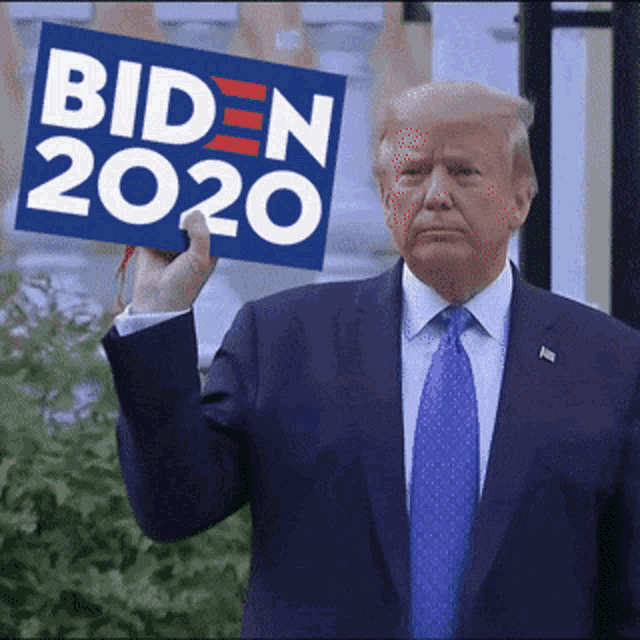

SystemExit: 

C:\Users\victo\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3339: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [8]:
#Start game
room_0()

# Sources:

* https://stackoverflow.com/questions/49354232/how-to-stream-audio-from-a-youtube-url-in-python-without-download 
* http://www.unicode.org/emoji/charts/full-emoji-list.html
* https://stackoverflow.com/questions/44472162/how-do-play-audio-playsound-in-background-of-python-script
* https://www.pygame.org/docs/ref/mixer.html#pygame.mixer.init
* https://www.numfys.net/howto/animations/